# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

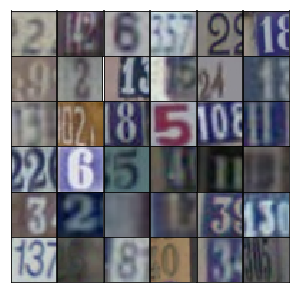

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
# Scale works the same as Tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(input_dim):
    # Input data to the modal
    inputs = tf.placeholder(tf.float32, (None, *input_dim), name=None)
    
    # Indices/output/target/classes data to the model
    indices = tf.placeholder(tf.int32, (None), name=None)    
    
    return inputs, indices

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
# tf.layers.conv2d(
#     inputs, ----------
#     filters, -------------
#     kernel_size, ------------
#     strides=(1, 1), ---------------
#     padding='valid', ------------
#     data_format='channels_last', -------------> NHWC and not NCHW
#     dilation_rate=(1, 1), -------------------
#     activation=None,
#     use_bias=True, ------------------
#     kernel_initializer=None,
#     bias_initializer=tf.zeros_initializer(), ------------------
#     kernel_regularizer=None,
#     bias_regularizer=None,
#     activity_regularizer=None,
#     kernel_constraint=None,
#     bias_constraint=None,
#     trainable=True, ---------------------
#     name=None,
#     reuse=None
# )

In [10]:
# Qfunction or qfunction, q/Q is quality and this is used as a classifier or q-learning or q-network
def qfunction(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('qfunction', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it to the number of classes 
        # Let's imagine (4*4*512) is the number of classes.
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        #logits = tf.layers.dense(nl3_vec, 4*4*512)
        logits = tf.layers.dense(nl3_vec, output_dim) # this is for the classification task
        predictions = tf.nn.softmax(logits)
        # 4x4x512 now
        
        return logits, predictions

In [11]:
def generator(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # Reshape it to start the convolutional stack
        h1 = tf.layers.dense(inputs, 4*4*512)
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        nl1_mat = tf.reshape(nl1, (-1, 4, 4, 512))
        # 4x4x512 now
        
        h2 = tf.layers.conv2d_transpose(inputs=nl1_mat, filters=256, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x256 now
        
        h3 = tf.layers.conv2d_transpose(inputs=nl2, filters=128, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(inputs=nl3, filters=output_dim, kernel_size=5, strides=2, padding='same')        
        predictions = tf.tanh(logits) # inputs data is scaled!
        # 32x32x3 now

        # generated input or input fake
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [12]:
def discriminator(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        #predictions = tf.sigmoid(logits)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [13]:
# This is to determin the number of classes
trainset['y'].max(), trainset['y'].min()

(10, 1)

In [14]:
def model_loss(inputs_real, input_dim, indices_real, indices_dim):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param input_dim: Input image dimensions
    :param indices_real: Target/output class/label numbers
    :param indices_dim: Number of output classes or dimensions
    :return: A tuple of (qfunction loss, generator loss, discriminator loss)
    """
    # Generating/reconstructing the fake inputs using real inputs
    q_logits, q_preds = qfunction(inputs=inputs_real, output_dim=indices_dim)
    inputs_fake = generator(inputs=q_preds, output_dim=input_dim)
    
    # Qfunction loss using real and fake inputs: Classification error
    q_loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits_v2(logits=q_logits, 
                                                   labels=tf.one_hot(depth=indices_dim, indices=indices_real)))

    # Discriminator logits fake and real for G & D losses
    d_logits_fake = discriminator(inputs=tf.sigmoid(inputs_fake), reuse=False)
    d_logits_real = discriminator(inputs=tf.sigmoid(inputs_real), reuse=True)

    # Generator loss
    g_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.zeros_like(d_logits_real)))
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss = g_loss_real + g_loss_fake

    # Reconstruction/prediction loss affects both Q & G
    loss_reconst = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=inputs_fake, labels=tf.sigmoid(inputs_real)))
    q_loss += loss_reconst
    g_loss += loss_reconst

    # Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return q_loss, g_loss, d_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [15]:
def model_opt(q_loss, g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param q_loss: Qfunction loss Tensor
    :param g_loss: Generator loss Tensor
    :param d_loss: Discriminator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    q_vars = [var for var in t_vars if var.name.startswith('qfunction')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        q_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(q_loss, var_list=q_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return q_opt, g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [16]:
class GAN:
    def __init__(self, input_dim, indices_dim, learning_rate, beta1):
        tf.reset_default_graph()
        
        # Model inputs/data 
        self.inputs_real, self.indices_real = model_inputs(input_dim=input_dim)
        
        # Model losses/logits
        self.q_loss, self.g_loss, self.d_loss = model_loss(inputs_real=self.inputs_real, input_dim=input_dim[2],
                                                           indices_real=self.indices_real, indices_dim=indices_dim)

        # Model update/optimization
        self.q_opt, self.g_opt, self.d_opt = model_opt(q_loss=self.q_loss, 
                                                       g_loss=self.g_loss, 
                                                       d_loss=self.d_loss, 
                                                       learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [17]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [18]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        
        # Initialize the model variable if there is no model available to load/restore
        sess.run(tf.global_variables_initializer())
        
        #         # Restore/load the trained model
        #         #saver.restore(sess, './checkpoints/model.ckpt')
        #         saver.restore(sess, tf.train.latest_checkpoint('checkpoints/'))
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for inputs_real, indices_real in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={model.inputs_real: inputs_real, model.indices_real: indices_real}
                _ = sess.run(model.q_opt, feed_dict)
                _ = sess.run(model.g_opt, feed_dict)
                _ = sess.run(model.d_opt, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    q_loss = model.q_loss.eval(feed_dict)
                    g_loss = model.g_loss.eval(feed_dict)
                    d_loss = model.d_loss.eval(feed_dict)

                    print("Epoch {}/{}".format(e+1, epochs),
                          "Qfunction Loss:{:.4f}".format(q_loss),
                          "Generator Loss:{:.4f}".format(g_loss),
                          "Discriminator Loss:{:.4f}".format(d_loss))
                    
                    # Save losses to view after training
                    losses.append((q_loss, g_loss, d_loss))

                if steps % show_every == 0:
                    _, model_qpreds = qfunction(inputs=model.inputs_real, output_dim=10, reuse=True, training=False)
                    model_glogits = generator(inputs=model_qpreds, output_dim=3, reuse=True, training=False)
                    glogits = sess.run(model_glogits, feed_dict)
                    #reconst_inputs = glogits
                    samples.append(glogits)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        # Save the trained model
        saver.save(sess, './checkpoints/model3.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [19]:
# ADAM default parameters
# __init__(
#     learning_rate=0.001,
#     beta1=0.9,
#     beta2=0.999,
#     epsilon=1e-08,
#     use_locking=False,
#     name='Adam'
# )

In [20]:
# Dataset for the model
dataset = Dataset(trainset, testset)

In [21]:
dataset.train_y.shape, dataset.train_y.max()

((73257, 1), 10)

In [22]:
image_size = (32,32,3)
num_classes = 10
learning_rate = 0.001
beta1 = 0.5
batch_size = 128
epochs = 10
alpha = 0.1

# Create the network
model = GAN(input_dim=image_size, indices_dim=num_classes, learning_rate=learning_rate, beta1=beta1)

Epoch 1/10 Qfunction Loss:2.5628 Generator Loss:3.2336 Discriminator Loss:1.2707
Epoch 1/10 Qfunction Loss:2.3900 Generator Loss:2.8406 Discriminator Loss:0.9717
Epoch 1/10 Qfunction Loss:1.8386 Generator Loss:2.9744 Discriminator Loss:1.0097
Epoch 1/10 Qfunction Loss:1.6280 Generator Loss:2.8331 Discriminator Loss:0.9806
Epoch 1/10 Qfunction Loss:1.2833 Generator Loss:3.4287 Discriminator Loss:0.9551
Epoch 1/10 Qfunction Loss:1.3831 Generator Loss:3.0812 Discriminator Loss:0.9467
Epoch 1/10 Qfunction Loss:1.1159 Generator Loss:3.3975 Discriminator Loss:1.1116
Epoch 1/10 Qfunction Loss:1.0966 Generator Loss:3.2896 Discriminator Loss:0.8590
Epoch 1/10 Qfunction Loss:1.1470 Generator Loss:3.1702 Discriminator Loss:0.8221
Epoch 1/10 Qfunction Loss:1.2685 Generator Loss:3.0567 Discriminator Loss:1.2323


/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


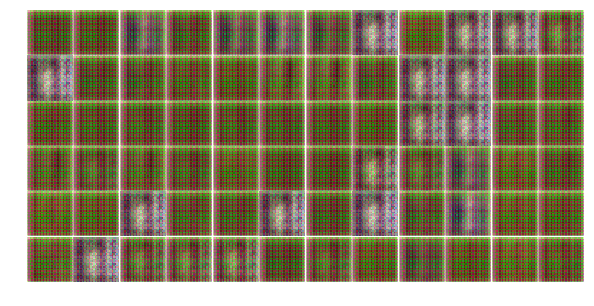

Epoch 1/10 Qfunction Loss:1.2374 Generator Loss:2.7882 Discriminator Loss:1.0440
Epoch 1/10 Qfunction Loss:1.3525 Generator Loss:3.2993 Discriminator Loss:0.9052
Epoch 1/10 Qfunction Loss:1.4167 Generator Loss:3.1003 Discriminator Loss:0.8144
Epoch 1/10 Qfunction Loss:1.1515 Generator Loss:3.2800 Discriminator Loss:0.8400
Epoch 1/10 Qfunction Loss:1.4437 Generator Loss:3.0034 Discriminator Loss:0.8720
Epoch 1/10 Qfunction Loss:1.3985 Generator Loss:2.8098 Discriminator Loss:0.9926
Epoch 1/10 Qfunction Loss:1.2749 Generator Loss:2.4975 Discriminator Loss:1.4215
Epoch 1/10 Qfunction Loss:1.3719 Generator Loss:2.6064 Discriminator Loss:1.1730
Epoch 1/10 Qfunction Loss:1.1684 Generator Loss:2.7530 Discriminator Loss:1.0409
Epoch 1/10 Qfunction Loss:1.8716 Generator Loss:2.7880 Discriminator Loss:1.1034


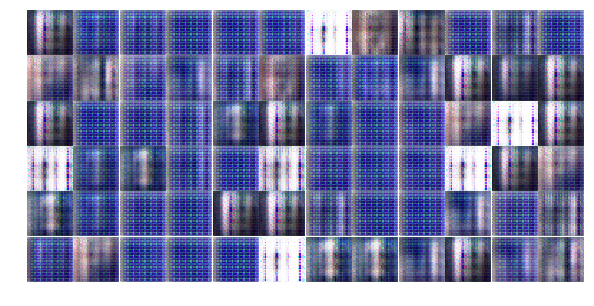

Epoch 1/10 Qfunction Loss:1.1344 Generator Loss:2.7680 Discriminator Loss:1.0266
Epoch 1/10 Qfunction Loss:1.2567 Generator Loss:3.3396 Discriminator Loss:1.2021
Epoch 1/10 Qfunction Loss:1.3114 Generator Loss:3.5434 Discriminator Loss:1.0135
Epoch 1/10 Qfunction Loss:1.4383 Generator Loss:2.9981 Discriminator Loss:0.9210
Epoch 1/10 Qfunction Loss:1.2648 Generator Loss:3.3122 Discriminator Loss:0.8582
Epoch 1/10 Qfunction Loss:1.5625 Generator Loss:3.0190 Discriminator Loss:1.0011
Epoch 1/10 Qfunction Loss:1.5756 Generator Loss:3.1071 Discriminator Loss:1.0509
Epoch 1/10 Qfunction Loss:1.2004 Generator Loss:3.2406 Discriminator Loss:0.9855
Epoch 1/10 Qfunction Loss:1.2450 Generator Loss:2.9350 Discriminator Loss:0.9841
Epoch 1/10 Qfunction Loss:1.3083 Generator Loss:3.2061 Discriminator Loss:0.8643


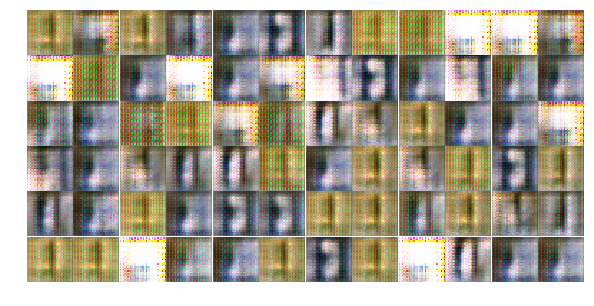

Epoch 1/10 Qfunction Loss:1.9485 Generator Loss:3.2609 Discriminator Loss:0.8949
Epoch 1/10 Qfunction Loss:1.3164 Generator Loss:3.7238 Discriminator Loss:0.6744
Epoch 1/10 Qfunction Loss:1.4394 Generator Loss:4.2809 Discriminator Loss:1.2092
Epoch 1/10 Qfunction Loss:1.8058 Generator Loss:4.3338 Discriminator Loss:0.4311
Epoch 1/10 Qfunction Loss:1.4400 Generator Loss:3.2516 Discriminator Loss:0.9245
Epoch 1/10 Qfunction Loss:1.1424 Generator Loss:3.4126 Discriminator Loss:0.7128
Epoch 1/10 Qfunction Loss:1.4343 Generator Loss:3.4378 Discriminator Loss:0.9237
Epoch 1/10 Qfunction Loss:1.2525 Generator Loss:3.2883 Discriminator Loss:0.7517
Epoch 1/10 Qfunction Loss:1.2374 Generator Loss:4.2463 Discriminator Loss:1.7164
Epoch 1/10 Qfunction Loss:1.2672 Generator Loss:3.7773 Discriminator Loss:0.6596


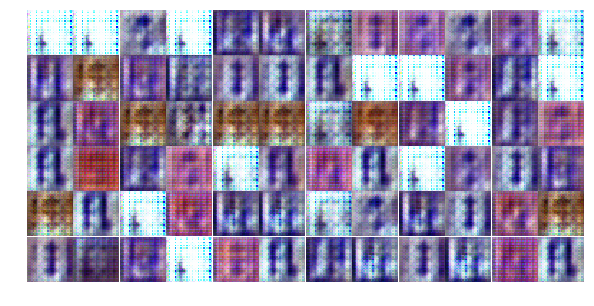

Epoch 1/10 Qfunction Loss:1.5025 Generator Loss:3.0740 Discriminator Loss:0.9159
Epoch 1/10 Qfunction Loss:1.6722 Generator Loss:3.4569 Discriminator Loss:0.7496
Epoch 1/10 Qfunction Loss:1.3101 Generator Loss:2.8405 Discriminator Loss:1.0445
Epoch 1/10 Qfunction Loss:1.5674 Generator Loss:2.6113 Discriminator Loss:1.2376
Epoch 1/10 Qfunction Loss:1.0553 Generator Loss:2.9334 Discriminator Loss:1.0917
Epoch 1/10 Qfunction Loss:2.3039 Generator Loss:3.6280 Discriminator Loss:1.4324
Epoch 1/10 Qfunction Loss:2.0561 Generator Loss:2.9507 Discriminator Loss:0.9270
Epoch 1/10 Qfunction Loss:1.8875 Generator Loss:3.3002 Discriminator Loss:0.8514
Epoch 1/10 Qfunction Loss:1.0293 Generator Loss:3.6547 Discriminator Loss:0.9438
Epoch 1/10 Qfunction Loss:1.3810 Generator Loss:2.9630 Discriminator Loss:1.0289


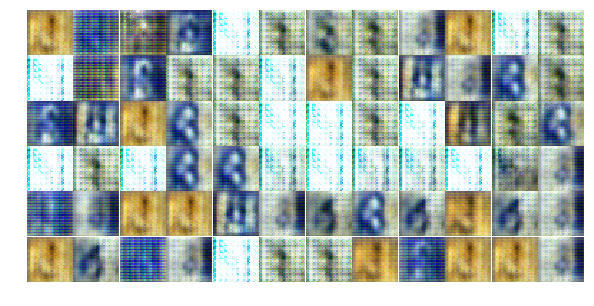

Epoch 1/10 Qfunction Loss:2.3228 Generator Loss:3.2269 Discriminator Loss:0.8717
Epoch 1/10 Qfunction Loss:1.5749 Generator Loss:4.4369 Discriminator Loss:0.9156
Epoch 1/10 Qfunction Loss:1.8492 Generator Loss:4.2018 Discriminator Loss:0.6090
Epoch 1/10 Qfunction Loss:2.1118 Generator Loss:3.1515 Discriminator Loss:0.8963
Epoch 1/10 Qfunction Loss:1.6854 Generator Loss:3.6667 Discriminator Loss:0.7030
Epoch 1/10 Qfunction Loss:1.6018 Generator Loss:3.2720 Discriminator Loss:1.0544
Epoch 1/10 Qfunction Loss:1.7388 Generator Loss:3.0730 Discriminator Loss:1.4996
Epoch 2/10 Qfunction Loss:1.5302 Generator Loss:2.8577 Discriminator Loss:1.6310
Epoch 2/10 Qfunction Loss:1.2017 Generator Loss:3.2018 Discriminator Loss:0.8656
Epoch 2/10 Qfunction Loss:1.6701 Generator Loss:3.6493 Discriminator Loss:1.2452


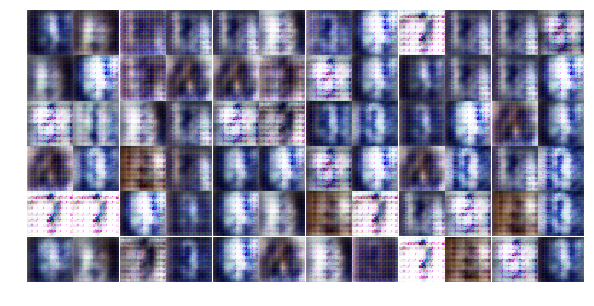

Epoch 2/10 Qfunction Loss:1.4424 Generator Loss:3.9944 Discriminator Loss:2.0537
Epoch 2/10 Qfunction Loss:1.2324 Generator Loss:3.5812 Discriminator Loss:0.6956
Epoch 2/10 Qfunction Loss:2.2148 Generator Loss:3.1748 Discriminator Loss:1.1654
Epoch 2/10 Qfunction Loss:2.7209 Generator Loss:3.9557 Discriminator Loss:0.7799
Epoch 2/10 Qfunction Loss:1.7786 Generator Loss:2.6889 Discriminator Loss:1.2728
Epoch 2/10 Qfunction Loss:1.4015 Generator Loss:2.9735 Discriminator Loss:1.1352
Epoch 2/10 Qfunction Loss:2.1829 Generator Loss:3.0172 Discriminator Loss:0.9339
Epoch 2/10 Qfunction Loss:4.4092 Generator Loss:3.2420 Discriminator Loss:0.8364
Epoch 2/10 Qfunction Loss:1.2401 Generator Loss:3.3693 Discriminator Loss:0.7736
Epoch 2/10 Qfunction Loss:1.4356 Generator Loss:2.8189 Discriminator Loss:1.0206


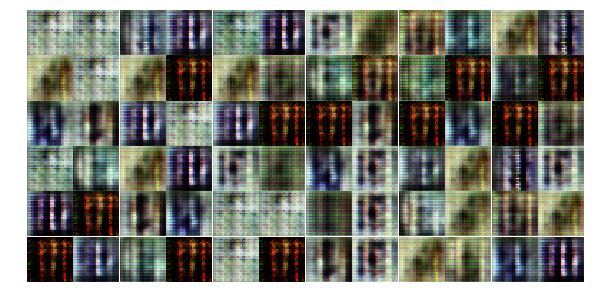

Epoch 2/10 Qfunction Loss:1.9590 Generator Loss:3.5482 Discriminator Loss:0.7086
Epoch 2/10 Qfunction Loss:1.4565 Generator Loss:2.9587 Discriminator Loss:1.0007
Epoch 2/10 Qfunction Loss:1.5450 Generator Loss:3.0853 Discriminator Loss:0.8537
Epoch 2/10 Qfunction Loss:1.8135 Generator Loss:3.2105 Discriminator Loss:0.8624
Epoch 2/10 Qfunction Loss:2.1084 Generator Loss:3.8532 Discriminator Loss:0.7656
Epoch 2/10 Qfunction Loss:1.3589 Generator Loss:3.0268 Discriminator Loss:0.9770
Epoch 2/10 Qfunction Loss:1.3226 Generator Loss:2.8362 Discriminator Loss:1.1748
Epoch 2/10 Qfunction Loss:2.2041 Generator Loss:3.0485 Discriminator Loss:0.8624
Epoch 2/10 Qfunction Loss:2.4606 Generator Loss:2.7720 Discriminator Loss:1.0133
Epoch 2/10 Qfunction Loss:2.3420 Generator Loss:3.7684 Discriminator Loss:0.9891


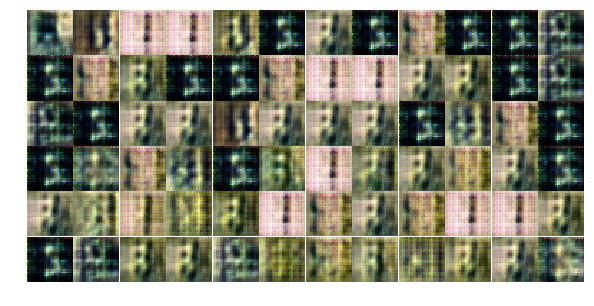

Epoch 2/10 Qfunction Loss:2.2467 Generator Loss:3.4490 Discriminator Loss:0.9223
Epoch 2/10 Qfunction Loss:2.1703 Generator Loss:2.7193 Discriminator Loss:1.1876
Epoch 2/10 Qfunction Loss:1.6101 Generator Loss:3.1745 Discriminator Loss:0.8384
Epoch 2/10 Qfunction Loss:2.7641 Generator Loss:3.5473 Discriminator Loss:0.9155
Epoch 2/10 Qfunction Loss:1.6232 Generator Loss:4.0306 Discriminator Loss:0.5115
Epoch 2/10 Qfunction Loss:1.9014 Generator Loss:3.4750 Discriminator Loss:0.9986
Epoch 2/10 Qfunction Loss:1.5311 Generator Loss:3.8478 Discriminator Loss:0.6090
Epoch 2/10 Qfunction Loss:3.8961 Generator Loss:3.2281 Discriminator Loss:0.8897
Epoch 2/10 Qfunction Loss:2.3128 Generator Loss:2.9595 Discriminator Loss:0.8779
Epoch 2/10 Qfunction Loss:2.7192 Generator Loss:2.8096 Discriminator Loss:1.0386


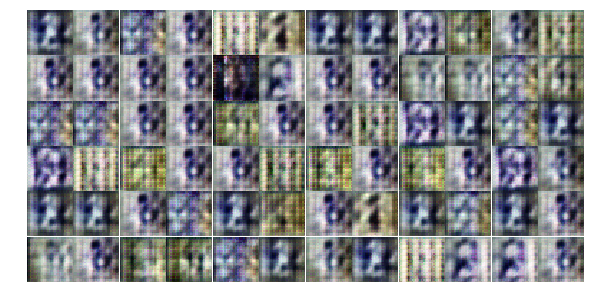

Epoch 2/10 Qfunction Loss:1.5471 Generator Loss:2.5362 Discriminator Loss:1.1085
Epoch 2/10 Qfunction Loss:3.1655 Generator Loss:2.9080 Discriminator Loss:1.0255
Epoch 2/10 Qfunction Loss:2.2887 Generator Loss:3.3578 Discriminator Loss:0.7505
Epoch 2/10 Qfunction Loss:3.4004 Generator Loss:4.0502 Discriminator Loss:0.9173
Epoch 2/10 Qfunction Loss:3.3131 Generator Loss:3.1047 Discriminator Loss:1.0187
Epoch 2/10 Qfunction Loss:2.5937 Generator Loss:3.3833 Discriminator Loss:0.8486
Epoch 2/10 Qfunction Loss:1.9056 Generator Loss:3.8011 Discriminator Loss:1.4957
Epoch 2/10 Qfunction Loss:1.6536 Generator Loss:3.5875 Discriminator Loss:0.7495
Epoch 2/10 Qfunction Loss:2.8025 Generator Loss:3.2493 Discriminator Loss:0.9017
Epoch 2/10 Qfunction Loss:1.5448 Generator Loss:3.5188 Discriminator Loss:0.9744


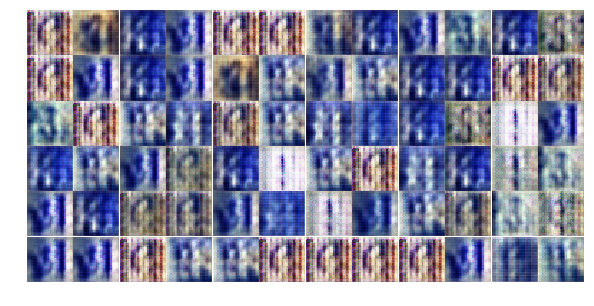

Epoch 2/10 Qfunction Loss:2.1939 Generator Loss:3.3924 Discriminator Loss:1.0314
Epoch 2/10 Qfunction Loss:3.2151 Generator Loss:3.2496 Discriminator Loss:0.9461
Epoch 2/10 Qfunction Loss:3.2382 Generator Loss:4.5003 Discriminator Loss:1.0571
Epoch 2/10 Qfunction Loss:1.6250 Generator Loss:3.1837 Discriminator Loss:0.9240
Epoch 2/10 Qfunction Loss:2.4442 Generator Loss:2.9717 Discriminator Loss:0.9141
Epoch 2/10 Qfunction Loss:4.7688 Generator Loss:3.4992 Discriminator Loss:1.0428
Epoch 2/10 Qfunction Loss:1.9668 Generator Loss:3.5225 Discriminator Loss:0.8490
Epoch 2/10 Qfunction Loss:3.6090 Generator Loss:2.8445 Discriminator Loss:1.1902
Epoch 2/10 Qfunction Loss:2.7933 Generator Loss:3.6746 Discriminator Loss:1.3112
Epoch 2/10 Qfunction Loss:1.6743 Generator Loss:4.4605 Discriminator Loss:1.4913


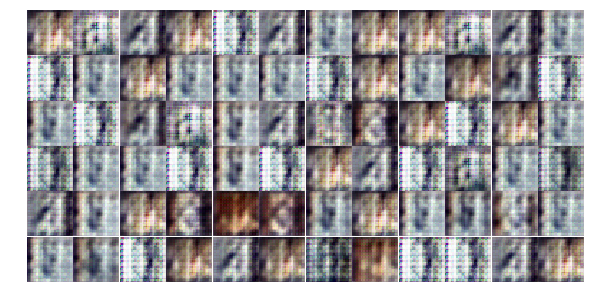

Epoch 2/10 Qfunction Loss:1.8674 Generator Loss:3.3615 Discriminator Loss:0.8018
Epoch 2/10 Qfunction Loss:3.2831 Generator Loss:4.7303 Discriminator Loss:1.1056
Epoch 2/10 Qfunction Loss:1.6894 Generator Loss:3.5031 Discriminator Loss:1.0103
Epoch 2/10 Qfunction Loss:3.6281 Generator Loss:3.4500 Discriminator Loss:0.7476
Epoch 3/10 Qfunction Loss:1.6177 Generator Loss:3.0711 Discriminator Loss:0.8276
Epoch 3/10 Qfunction Loss:1.4544 Generator Loss:3.3650 Discriminator Loss:0.9545
Epoch 3/10 Qfunction Loss:2.6244 Generator Loss:3.4959 Discriminator Loss:0.9774
Epoch 3/10 Qfunction Loss:3.6516 Generator Loss:3.2194 Discriminator Loss:1.1072
Epoch 3/10 Qfunction Loss:1.8726 Generator Loss:3.1660 Discriminator Loss:0.9950
Epoch 3/10 Qfunction Loss:3.9079 Generator Loss:3.8422 Discriminator Loss:1.1864


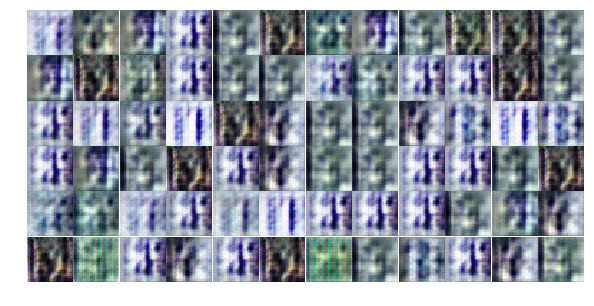

Epoch 3/10 Qfunction Loss:3.0783 Generator Loss:3.6148 Discriminator Loss:0.7296
Epoch 3/10 Qfunction Loss:2.0592 Generator Loss:3.3886 Discriminator Loss:0.9637
Epoch 3/10 Qfunction Loss:4.2124 Generator Loss:4.1022 Discriminator Loss:0.8219
Epoch 3/10 Qfunction Loss:1.7859 Generator Loss:3.1516 Discriminator Loss:1.1243
Epoch 3/10 Qfunction Loss:3.0194 Generator Loss:3.1616 Discriminator Loss:1.0030
Epoch 3/10 Qfunction Loss:3.6033 Generator Loss:3.4562 Discriminator Loss:0.7763
Epoch 3/10 Qfunction Loss:2.6725 Generator Loss:3.6711 Discriminator Loss:0.7901
Epoch 3/10 Qfunction Loss:3.6694 Generator Loss:6.2301 Discriminator Loss:1.6527
Epoch 3/10 Qfunction Loss:2.2613 Generator Loss:3.8948 Discriminator Loss:0.7030
Epoch 3/10 Qfunction Loss:2.4344 Generator Loss:4.8585 Discriminator Loss:1.2622


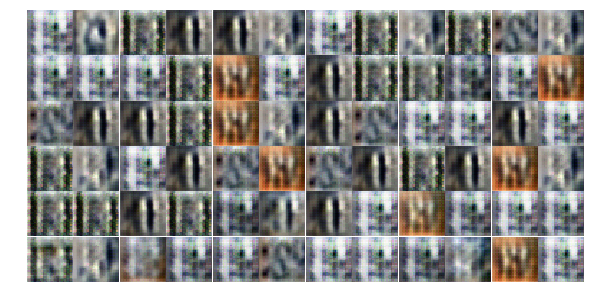

Epoch 3/10 Qfunction Loss:3.3991 Generator Loss:3.7515 Discriminator Loss:0.6610
Epoch 3/10 Qfunction Loss:1.3003 Generator Loss:4.1104 Discriminator Loss:1.5724
Epoch 3/10 Qfunction Loss:1.5792 Generator Loss:3.3569 Discriminator Loss:0.8922
Epoch 3/10 Qfunction Loss:2.1673 Generator Loss:3.7015 Discriminator Loss:0.6879
Epoch 3/10 Qfunction Loss:1.6120 Generator Loss:3.3077 Discriminator Loss:0.9735
Epoch 3/10 Qfunction Loss:3.2675 Generator Loss:4.2020 Discriminator Loss:1.1617
Epoch 3/10 Qfunction Loss:3.7630 Generator Loss:3.5636 Discriminator Loss:0.8030
Epoch 3/10 Qfunction Loss:2.5211 Generator Loss:3.8004 Discriminator Loss:1.0219
Epoch 3/10 Qfunction Loss:3.5787 Generator Loss:3.0417 Discriminator Loss:0.9988
Epoch 3/10 Qfunction Loss:5.7294 Generator Loss:4.2263 Discriminator Loss:1.5468


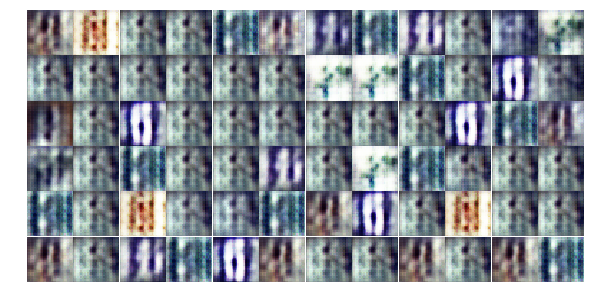

Epoch 3/10 Qfunction Loss:2.6672 Generator Loss:3.4798 Discriminator Loss:1.0952
Epoch 3/10 Qfunction Loss:3.8877 Generator Loss:3.1539 Discriminator Loss:0.9581
Epoch 3/10 Qfunction Loss:3.4549 Generator Loss:3.9920 Discriminator Loss:0.7017
Epoch 3/10 Qfunction Loss:2.6286 Generator Loss:3.7341 Discriminator Loss:0.8163
Epoch 3/10 Qfunction Loss:3.3413 Generator Loss:2.9346 Discriminator Loss:1.0470
Epoch 3/10 Qfunction Loss:2.9826 Generator Loss:3.3272 Discriminator Loss:0.8012
Epoch 3/10 Qfunction Loss:2.6326 Generator Loss:3.4439 Discriminator Loss:0.8253
Epoch 3/10 Qfunction Loss:3.1266 Generator Loss:3.7060 Discriminator Loss:0.7775
Epoch 3/10 Qfunction Loss:3.0494 Generator Loss:3.8068 Discriminator Loss:1.2185
Epoch 3/10 Qfunction Loss:2.1225 Generator Loss:3.4797 Discriminator Loss:0.7484


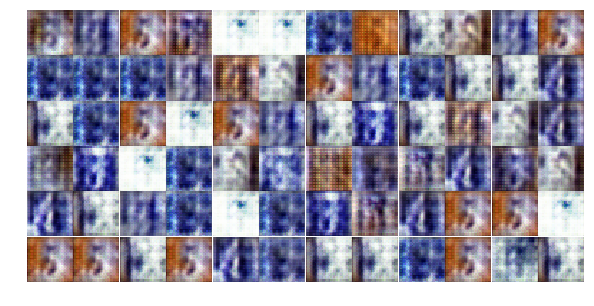

Epoch 3/10 Qfunction Loss:3.2765 Generator Loss:3.5860 Discriminator Loss:0.7895
Epoch 3/10 Qfunction Loss:2.6382 Generator Loss:3.4980 Discriminator Loss:0.8206
Epoch 3/10 Qfunction Loss:2.6587 Generator Loss:3.8148 Discriminator Loss:1.0178
Epoch 3/10 Qfunction Loss:3.1652 Generator Loss:3.2122 Discriminator Loss:0.9023
Epoch 3/10 Qfunction Loss:2.7654 Generator Loss:3.4146 Discriminator Loss:0.8917
Epoch 3/10 Qfunction Loss:2.2012 Generator Loss:3.2141 Discriminator Loss:0.8126
Epoch 3/10 Qfunction Loss:3.1462 Generator Loss:3.2492 Discriminator Loss:0.9217
Epoch 3/10 Qfunction Loss:2.4145 Generator Loss:3.6878 Discriminator Loss:0.7545
Epoch 3/10 Qfunction Loss:4.9217 Generator Loss:2.7838 Discriminator Loss:1.1097
Epoch 3/10 Qfunction Loss:2.6142 Generator Loss:3.1845 Discriminator Loss:0.9332


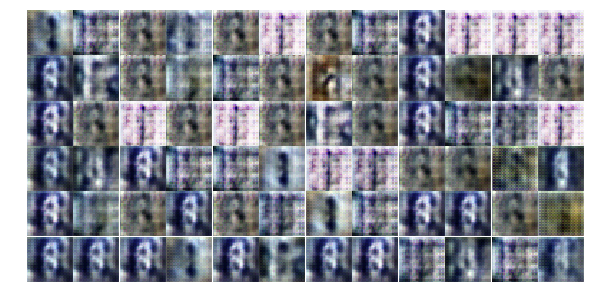

Epoch 3/10 Qfunction Loss:2.1038 Generator Loss:3.4697 Discriminator Loss:0.9703
Epoch 3/10 Qfunction Loss:3.9916 Generator Loss:3.8940 Discriminator Loss:0.5645
Epoch 3/10 Qfunction Loss:5.7172 Generator Loss:3.8961 Discriminator Loss:0.6429
Epoch 3/10 Qfunction Loss:3.4648 Generator Loss:3.7637 Discriminator Loss:0.6530
Epoch 3/10 Qfunction Loss:3.8607 Generator Loss:3.3174 Discriminator Loss:0.8158
Epoch 3/10 Qfunction Loss:2.5807 Generator Loss:3.2898 Discriminator Loss:0.9047
Epoch 3/10 Qfunction Loss:3.2509 Generator Loss:3.3199 Discriminator Loss:0.9885
Epoch 3/10 Qfunction Loss:3.6826 Generator Loss:2.8291 Discriminator Loss:1.1712
Epoch 3/10 Qfunction Loss:3.8376 Generator Loss:3.1253 Discriminator Loss:0.9154
Epoch 3/10 Qfunction Loss:2.1268 Generator Loss:3.7385 Discriminator Loss:0.8438


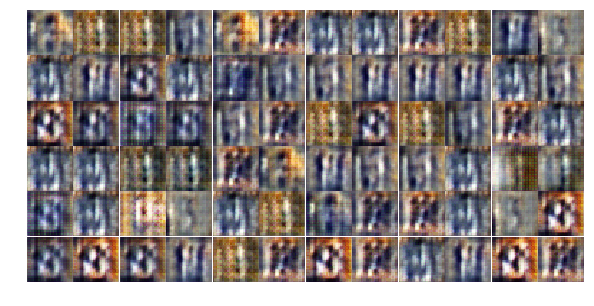

Epoch 3/10 Qfunction Loss:4.7347 Generator Loss:3.5845 Discriminator Loss:0.7037
Epoch 4/10 Qfunction Loss:2.4469 Generator Loss:3.2329 Discriminator Loss:0.8105
Epoch 4/10 Qfunction Loss:2.0565 Generator Loss:3.0236 Discriminator Loss:0.9248
Epoch 4/10 Qfunction Loss:4.5652 Generator Loss:2.6283 Discriminator Loss:1.1094
Epoch 4/10 Qfunction Loss:5.3360 Generator Loss:3.5313 Discriminator Loss:0.7726
Epoch 4/10 Qfunction Loss:4.1810 Generator Loss:4.4136 Discriminator Loss:1.4049
Epoch 4/10 Qfunction Loss:4.2481 Generator Loss:3.0243 Discriminator Loss:0.9792
Epoch 4/10 Qfunction Loss:1.7215 Generator Loss:3.8306 Discriminator Loss:0.6397
Epoch 4/10 Qfunction Loss:3.3374 Generator Loss:4.3229 Discriminator Loss:1.0517
Epoch 4/10 Qfunction Loss:3.0165 Generator Loss:3.2185 Discriminator Loss:0.8106


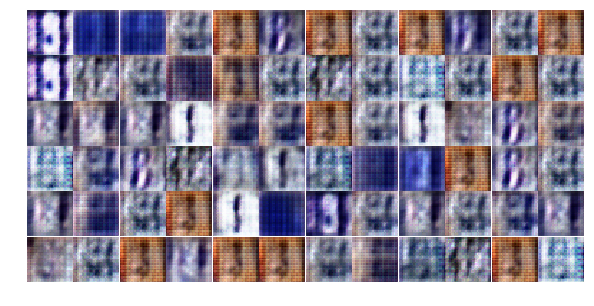

Epoch 4/10 Qfunction Loss:6.7309 Generator Loss:3.2587 Discriminator Loss:0.9235
Epoch 4/10 Qfunction Loss:4.7019 Generator Loss:4.1166 Discriminator Loss:0.9426
Epoch 4/10 Qfunction Loss:3.4607 Generator Loss:3.2940 Discriminator Loss:1.1216
Epoch 4/10 Qfunction Loss:2.8139 Generator Loss:3.4792 Discriminator Loss:0.7526
Epoch 4/10 Qfunction Loss:8.3062 Generator Loss:3.4036 Discriminator Loss:0.8237
Epoch 4/10 Qfunction Loss:4.4654 Generator Loss:3.1314 Discriminator Loss:1.3621
Epoch 4/10 Qfunction Loss:4.9497 Generator Loss:3.2722 Discriminator Loss:0.9705
Epoch 4/10 Qfunction Loss:3.7054 Generator Loss:3.1108 Discriminator Loss:0.8998
Epoch 4/10 Qfunction Loss:3.9577 Generator Loss:3.4131 Discriminator Loss:1.0108
Epoch 4/10 Qfunction Loss:3.6813 Generator Loss:3.4376 Discriminator Loss:0.8094


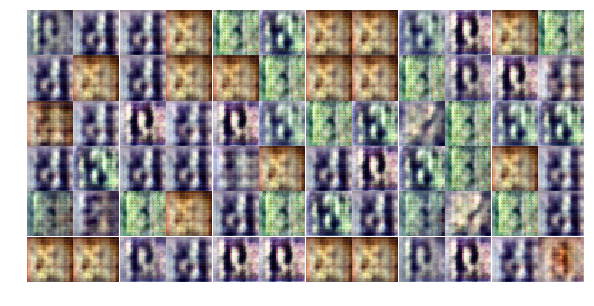

Epoch 4/10 Qfunction Loss:2.6447 Generator Loss:3.0460 Discriminator Loss:0.9819
Epoch 4/10 Qfunction Loss:2.8869 Generator Loss:3.7123 Discriminator Loss:0.7281
Epoch 4/10 Qfunction Loss:5.2459 Generator Loss:2.9946 Discriminator Loss:0.9154
Epoch 4/10 Qfunction Loss:2.1859 Generator Loss:3.1274 Discriminator Loss:0.9757
Epoch 4/10 Qfunction Loss:4.2049 Generator Loss:3.3173 Discriminator Loss:1.0037
Epoch 4/10 Qfunction Loss:4.6966 Generator Loss:3.8414 Discriminator Loss:0.6629
Epoch 4/10 Qfunction Loss:4.3747 Generator Loss:2.8272 Discriminator Loss:1.0321
Epoch 4/10 Qfunction Loss:2.6334 Generator Loss:3.5560 Discriminator Loss:0.6634
Epoch 4/10 Qfunction Loss:2.2007 Generator Loss:3.5203 Discriminator Loss:0.9284
Epoch 4/10 Qfunction Loss:2.8162 Generator Loss:3.1356 Discriminator Loss:0.8562


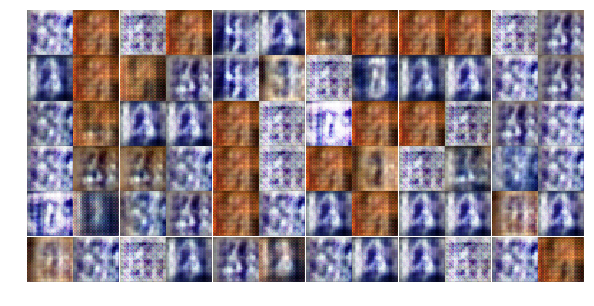

Epoch 4/10 Qfunction Loss:3.0122 Generator Loss:3.2940 Discriminator Loss:0.8075
Epoch 4/10 Qfunction Loss:3.1939 Generator Loss:3.2252 Discriminator Loss:0.9678
Epoch 4/10 Qfunction Loss:3.4462 Generator Loss:3.0249 Discriminator Loss:0.9186
Epoch 4/10 Qfunction Loss:3.7009 Generator Loss:3.4091 Discriminator Loss:0.9895
Epoch 4/10 Qfunction Loss:4.0437 Generator Loss:3.9262 Discriminator Loss:0.9007
Epoch 4/10 Qfunction Loss:2.0237 Generator Loss:3.8857 Discriminator Loss:0.6625
Epoch 4/10 Qfunction Loss:5.8679 Generator Loss:3.8006 Discriminator Loss:0.9736
Epoch 4/10 Qfunction Loss:2.8084 Generator Loss:3.2430 Discriminator Loss:0.8882
Epoch 4/10 Qfunction Loss:3.8176 Generator Loss:3.4120 Discriminator Loss:0.8656
Epoch 4/10 Qfunction Loss:4.1882 Generator Loss:3.3499 Discriminator Loss:1.0226


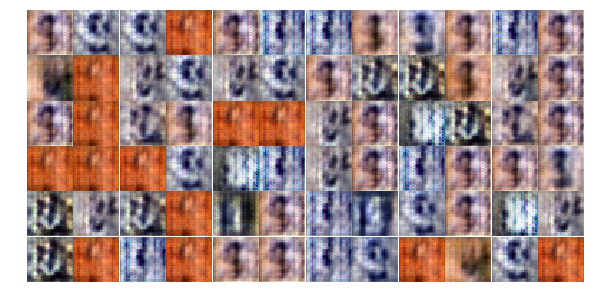

Epoch 4/10 Qfunction Loss:2.1885 Generator Loss:3.2012 Discriminator Loss:0.8710
Epoch 4/10 Qfunction Loss:4.4604 Generator Loss:3.5356 Discriminator Loss:0.9644
Epoch 4/10 Qfunction Loss:3.4270 Generator Loss:3.5375 Discriminator Loss:0.7156
Epoch 4/10 Qfunction Loss:3.9558 Generator Loss:3.9596 Discriminator Loss:0.6558
Epoch 4/10 Qfunction Loss:3.0875 Generator Loss:3.7109 Discriminator Loss:0.7896
Epoch 4/10 Qfunction Loss:4.2349 Generator Loss:4.0362 Discriminator Loss:1.0269
Epoch 4/10 Qfunction Loss:3.5684 Generator Loss:4.1243 Discriminator Loss:0.5409
Epoch 4/10 Qfunction Loss:4.8202 Generator Loss:3.6106 Discriminator Loss:1.1974
Epoch 4/10 Qfunction Loss:5.2673 Generator Loss:3.6288 Discriminator Loss:0.7426
Epoch 4/10 Qfunction Loss:2.2598 Generator Loss:3.8603 Discriminator Loss:0.8971


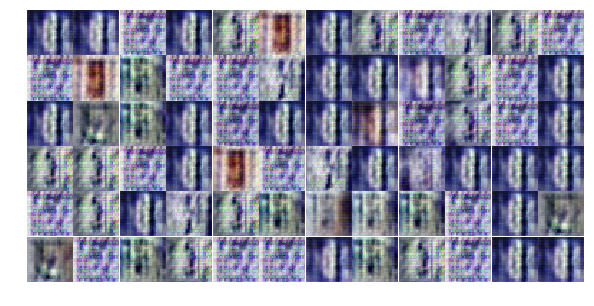

Epoch 4/10 Qfunction Loss:4.7654 Generator Loss:4.0816 Discriminator Loss:1.0312
Epoch 4/10 Qfunction Loss:6.1483 Generator Loss:3.5418 Discriminator Loss:0.8218
Epoch 4/10 Qfunction Loss:5.2842 Generator Loss:3.5313 Discriminator Loss:0.9457
Epoch 4/10 Qfunction Loss:6.8842 Generator Loss:3.4646 Discriminator Loss:0.8529
Epoch 4/10 Qfunction Loss:3.9667 Generator Loss:3.4140 Discriminator Loss:0.7454
Epoch 4/10 Qfunction Loss:2.2378 Generator Loss:3.9516 Discriminator Loss:0.8475
Epoch 4/10 Qfunction Loss:2.7905 Generator Loss:3.5759 Discriminator Loss:0.7888
Epoch 4/10 Qfunction Loss:2.1892 Generator Loss:3.5719 Discriminator Loss:0.6783
Epoch 4/10 Qfunction Loss:3.9849 Generator Loss:3.6570 Discriminator Loss:0.8155
Epoch 5/10 Qfunction Loss:6.1836 Generator Loss:3.2605 Discriminator Loss:1.0302


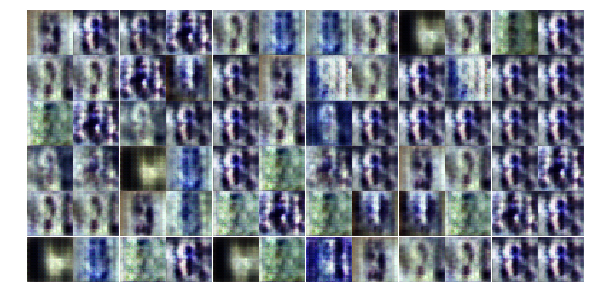

Epoch 5/10 Qfunction Loss:4.6761 Generator Loss:3.6125 Discriminator Loss:0.8659
Epoch 5/10 Qfunction Loss:3.0055 Generator Loss:3.3322 Discriminator Loss:1.0819
Epoch 5/10 Qfunction Loss:2.7340 Generator Loss:3.5143 Discriminator Loss:0.8957
Epoch 5/10 Qfunction Loss:4.5689 Generator Loss:3.4184 Discriminator Loss:0.8506
Epoch 5/10 Qfunction Loss:5.8589 Generator Loss:3.4440 Discriminator Loss:0.9672
Epoch 5/10 Qfunction Loss:3.6597 Generator Loss:3.8242 Discriminator Loss:0.6716
Epoch 5/10 Qfunction Loss:4.0437 Generator Loss:3.8422 Discriminator Loss:0.8958
Epoch 5/10 Qfunction Loss:3.1928 Generator Loss:3.7206 Discriminator Loss:0.8165
Epoch 5/10 Qfunction Loss:4.0478 Generator Loss:3.8099 Discriminator Loss:0.7669
Epoch 5/10 Qfunction Loss:5.1505 Generator Loss:3.3210 Discriminator Loss:1.1823


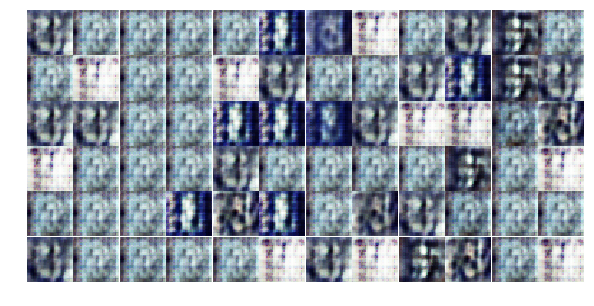

Epoch 5/10 Qfunction Loss:3.6474 Generator Loss:2.9089 Discriminator Loss:1.0323
Epoch 5/10 Qfunction Loss:2.3515 Generator Loss:3.3641 Discriminator Loss:0.7591
Epoch 5/10 Qfunction Loss:7.2509 Generator Loss:3.0603 Discriminator Loss:1.0431
Epoch 5/10 Qfunction Loss:2.7601 Generator Loss:3.4943 Discriminator Loss:0.8837
Epoch 5/10 Qfunction Loss:4.4081 Generator Loss:3.2722 Discriminator Loss:0.8307
Epoch 5/10 Qfunction Loss:3.1195 Generator Loss:3.3624 Discriminator Loss:0.9950
Epoch 5/10 Qfunction Loss:3.8136 Generator Loss:3.5111 Discriminator Loss:0.8382
Epoch 5/10 Qfunction Loss:6.4455 Generator Loss:3.6558 Discriminator Loss:0.7648
Epoch 5/10 Qfunction Loss:5.1016 Generator Loss:3.2301 Discriminator Loss:0.8652
Epoch 5/10 Qfunction Loss:5.1147 Generator Loss:3.0313 Discriminator Loss:0.9658


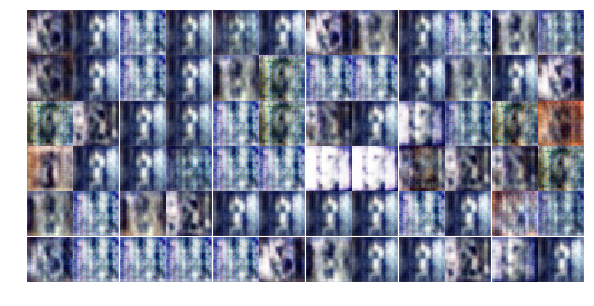

Epoch 5/10 Qfunction Loss:2.6569 Generator Loss:3.0764 Discriminator Loss:0.8987
Epoch 5/10 Qfunction Loss:7.3810 Generator Loss:3.2426 Discriminator Loss:0.8727
Epoch 5/10 Qfunction Loss:4.3599 Generator Loss:3.6855 Discriminator Loss:0.8343
Epoch 5/10 Qfunction Loss:4.2071 Generator Loss:3.0222 Discriminator Loss:1.0778
Epoch 5/10 Qfunction Loss:2.7772 Generator Loss:3.0429 Discriminator Loss:0.9130
Epoch 5/10 Qfunction Loss:3.1321 Generator Loss:3.2499 Discriminator Loss:0.9378
Epoch 5/10 Qfunction Loss:4.7923 Generator Loss:3.3560 Discriminator Loss:1.2099
Epoch 5/10 Qfunction Loss:2.7171 Generator Loss:3.3656 Discriminator Loss:0.8431
Epoch 5/10 Qfunction Loss:3.5874 Generator Loss:2.8507 Discriminator Loss:1.0073
Epoch 5/10 Qfunction Loss:4.5546 Generator Loss:3.2425 Discriminator Loss:0.8899


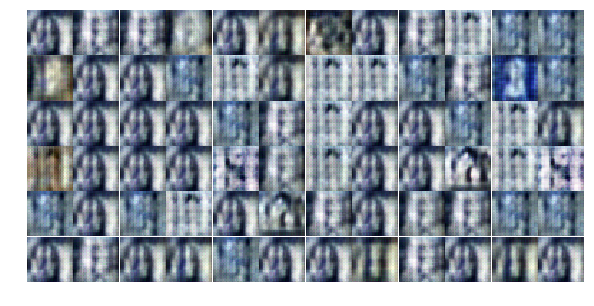

Epoch 5/10 Qfunction Loss:3.3926 Generator Loss:3.7442 Discriminator Loss:0.8855
Epoch 5/10 Qfunction Loss:6.7554 Generator Loss:3.4304 Discriminator Loss:0.7020
Epoch 5/10 Qfunction Loss:3.5911 Generator Loss:3.4351 Discriminator Loss:1.1551
Epoch 5/10 Qfunction Loss:2.1567 Generator Loss:3.5366 Discriminator Loss:0.7080
Epoch 5/10 Qfunction Loss:3.4618 Generator Loss:3.1241 Discriminator Loss:0.8812
Epoch 5/10 Qfunction Loss:2.4933 Generator Loss:3.6711 Discriminator Loss:0.6688
Epoch 5/10 Qfunction Loss:4.6301 Generator Loss:3.3757 Discriminator Loss:0.7501
Epoch 5/10 Qfunction Loss:2.9841 Generator Loss:3.1051 Discriminator Loss:0.9468
Epoch 5/10 Qfunction Loss:4.1935 Generator Loss:3.7311 Discriminator Loss:0.7032
Epoch 5/10 Qfunction Loss:5.9315 Generator Loss:3.3147 Discriminator Loss:0.8778


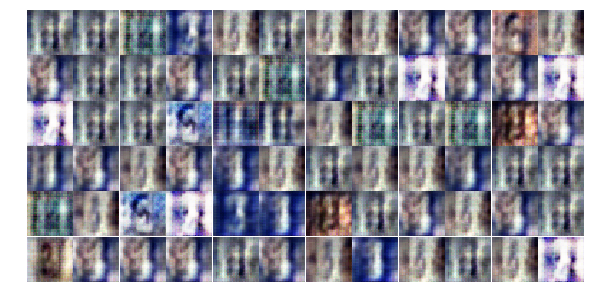

Epoch 5/10 Qfunction Loss:5.2738 Generator Loss:3.6530 Discriminator Loss:0.7564
Epoch 5/10 Qfunction Loss:7.1397 Generator Loss:3.9456 Discriminator Loss:0.7801
Epoch 5/10 Qfunction Loss:4.5686 Generator Loss:3.3979 Discriminator Loss:0.9651
Epoch 5/10 Qfunction Loss:4.0946 Generator Loss:2.9839 Discriminator Loss:0.9810
Epoch 5/10 Qfunction Loss:3.4995 Generator Loss:3.4369 Discriminator Loss:0.7246
Epoch 5/10 Qfunction Loss:4.7489 Generator Loss:4.0216 Discriminator Loss:0.9292
Epoch 5/10 Qfunction Loss:4.1567 Generator Loss:3.6936 Discriminator Loss:0.8338
Epoch 5/10 Qfunction Loss:6.5278 Generator Loss:3.8685 Discriminator Loss:1.0082
Epoch 5/10 Qfunction Loss:3.6607 Generator Loss:3.3027 Discriminator Loss:0.8610
Epoch 5/10 Qfunction Loss:3.8818 Generator Loss:3.1053 Discriminator Loss:0.9099


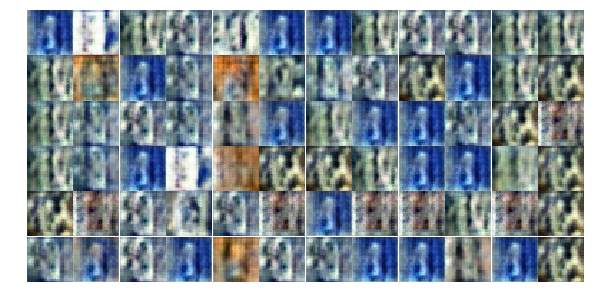

Epoch 5/10 Qfunction Loss:5.4591 Generator Loss:3.4521 Discriminator Loss:0.7774
Epoch 5/10 Qfunction Loss:2.5998 Generator Loss:3.4453 Discriminator Loss:0.7569
Epoch 5/10 Qfunction Loss:3.8030 Generator Loss:3.6076 Discriminator Loss:0.8936
Epoch 5/10 Qfunction Loss:7.7447 Generator Loss:3.7504 Discriminator Loss:1.0538
Epoch 5/10 Qfunction Loss:4.7006 Generator Loss:3.9902 Discriminator Loss:0.7501
Epoch 5/10 Qfunction Loss:4.2657 Generator Loss:3.9064 Discriminator Loss:0.9226
Epoch 6/10 Qfunction Loss:5.1822 Generator Loss:3.7511 Discriminator Loss:0.7330
Epoch 6/10 Qfunction Loss:4.7762 Generator Loss:3.6242 Discriminator Loss:0.7470
Epoch 6/10 Qfunction Loss:2.7384 Generator Loss:3.9895 Discriminator Loss:0.7120
Epoch 6/10 Qfunction Loss:6.0658 Generator Loss:3.7585 Discriminator Loss:0.6241


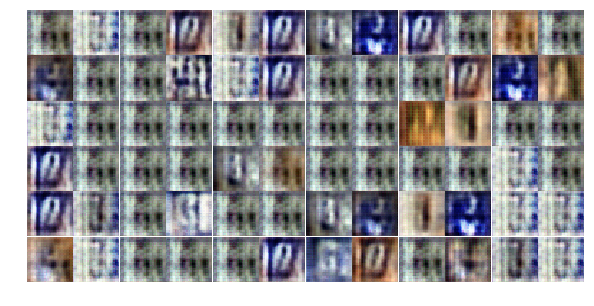

Epoch 6/10 Qfunction Loss:4.4172 Generator Loss:4.3258 Discriminator Loss:0.8625
Epoch 6/10 Qfunction Loss:7.3983 Generator Loss:3.8387 Discriminator Loss:0.8736
Epoch 6/10 Qfunction Loss:3.2266 Generator Loss:3.5459 Discriminator Loss:0.7318
Epoch 6/10 Qfunction Loss:3.2537 Generator Loss:4.5153 Discriminator Loss:0.4738
Epoch 6/10 Qfunction Loss:4.0368 Generator Loss:4.7025 Discriminator Loss:0.6735
Epoch 6/10 Qfunction Loss:4.7747 Generator Loss:3.8818 Discriminator Loss:0.9698
Epoch 6/10 Qfunction Loss:6.7688 Generator Loss:3.7227 Discriminator Loss:0.7146
Epoch 6/10 Qfunction Loss:2.4373 Generator Loss:3.9397 Discriminator Loss:0.8623
Epoch 6/10 Qfunction Loss:3.7254 Generator Loss:3.2968 Discriminator Loss:0.8950
Epoch 6/10 Qfunction Loss:12.8502 Generator Loss:3.3707 Discriminator Loss:0.8882


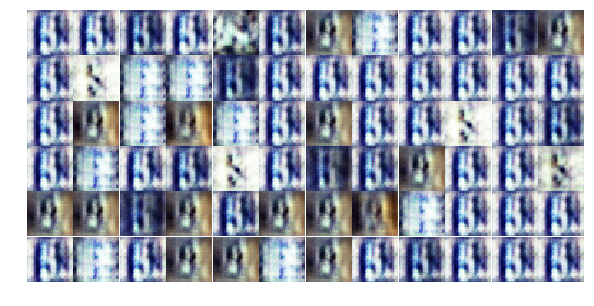

Epoch 6/10 Qfunction Loss:3.2392 Generator Loss:4.0226 Discriminator Loss:0.6732
Epoch 6/10 Qfunction Loss:4.1272 Generator Loss:3.5527 Discriminator Loss:0.7497
Epoch 6/10 Qfunction Loss:4.4119 Generator Loss:3.7968 Discriminator Loss:0.7032
Epoch 6/10 Qfunction Loss:6.7459 Generator Loss:3.8980 Discriminator Loss:0.8170
Epoch 6/10 Qfunction Loss:6.1986 Generator Loss:4.0067 Discriminator Loss:1.2305
Epoch 6/10 Qfunction Loss:6.9310 Generator Loss:4.0566 Discriminator Loss:0.7668
Epoch 6/10 Qfunction Loss:5.2374 Generator Loss:3.5940 Discriminator Loss:0.6578
Epoch 6/10 Qfunction Loss:5.1907 Generator Loss:3.9856 Discriminator Loss:0.6953
Epoch 6/10 Qfunction Loss:4.9207 Generator Loss:3.5113 Discriminator Loss:0.9210
Epoch 6/10 Qfunction Loss:7.2880 Generator Loss:4.0110 Discriminator Loss:0.6723


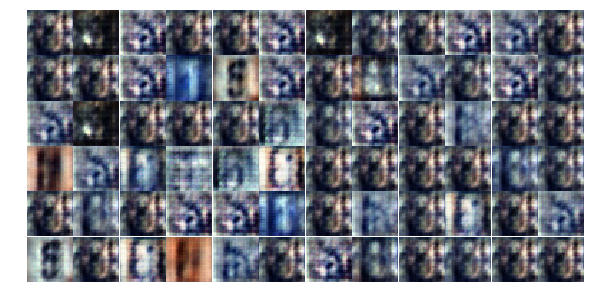

Epoch 6/10 Qfunction Loss:4.3628 Generator Loss:3.9576 Discriminator Loss:0.6027
Epoch 6/10 Qfunction Loss:3.4935 Generator Loss:3.2706 Discriminator Loss:0.8222
Epoch 6/10 Qfunction Loss:5.5060 Generator Loss:3.7368 Discriminator Loss:0.8440
Epoch 6/10 Qfunction Loss:5.1813 Generator Loss:3.7749 Discriminator Loss:0.7340
Epoch 6/10 Qfunction Loss:4.1428 Generator Loss:4.4468 Discriminator Loss:1.2101
Epoch 6/10 Qfunction Loss:6.4126 Generator Loss:3.3957 Discriminator Loss:0.7912
Epoch 6/10 Qfunction Loss:5.3097 Generator Loss:4.8277 Discriminator Loss:0.4862
Epoch 6/10 Qfunction Loss:3.6138 Generator Loss:4.1013 Discriminator Loss:0.7594
Epoch 6/10 Qfunction Loss:7.9511 Generator Loss:3.4185 Discriminator Loss:0.8253
Epoch 6/10 Qfunction Loss:7.9550 Generator Loss:3.6132 Discriminator Loss:0.8761


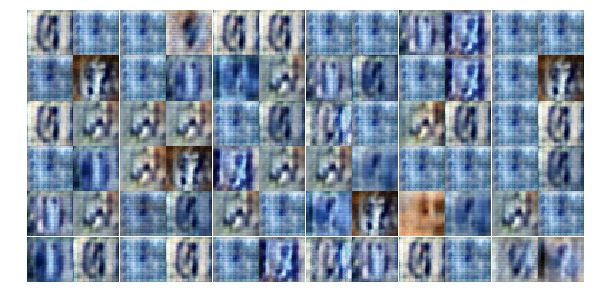

Epoch 6/10 Qfunction Loss:3.6225 Generator Loss:3.9637 Discriminator Loss:0.8917
Epoch 6/10 Qfunction Loss:3.3652 Generator Loss:4.0104 Discriminator Loss:0.6043
Epoch 6/10 Qfunction Loss:5.1302 Generator Loss:3.8730 Discriminator Loss:0.8114
Epoch 6/10 Qfunction Loss:6.5712 Generator Loss:4.5796 Discriminator Loss:0.6048
Epoch 6/10 Qfunction Loss:4.6099 Generator Loss:4.3522 Discriminator Loss:0.9681
Epoch 6/10 Qfunction Loss:2.0665 Generator Loss:3.7861 Discriminator Loss:0.9706
Epoch 6/10 Qfunction Loss:3.3349 Generator Loss:3.8995 Discriminator Loss:0.6661
Epoch 6/10 Qfunction Loss:8.2963 Generator Loss:4.1801 Discriminator Loss:0.6181
Epoch 6/10 Qfunction Loss:6.2878 Generator Loss:3.9377 Discriminator Loss:0.7423
Epoch 6/10 Qfunction Loss:4.5741 Generator Loss:3.8251 Discriminator Loss:0.6225


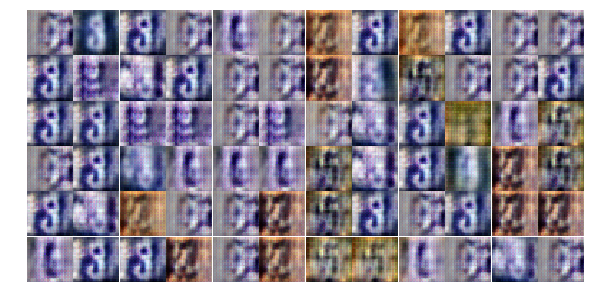

Epoch 6/10 Qfunction Loss:2.6876 Generator Loss:3.8395 Discriminator Loss:0.8276
Epoch 6/10 Qfunction Loss:4.9735 Generator Loss:4.0263 Discriminator Loss:0.6380
Epoch 6/10 Qfunction Loss:3.8643 Generator Loss:4.9847 Discriminator Loss:1.0229
Epoch 6/10 Qfunction Loss:6.3826 Generator Loss:4.4369 Discriminator Loss:0.5824
Epoch 6/10 Qfunction Loss:2.3853 Generator Loss:5.0340 Discriminator Loss:0.4208
Epoch 6/10 Qfunction Loss:4.2520 Generator Loss:4.2944 Discriminator Loss:0.4818
Epoch 6/10 Qfunction Loss:4.5933 Generator Loss:4.9149 Discriminator Loss:0.5571
Epoch 6/10 Qfunction Loss:3.6252 Generator Loss:4.5074 Discriminator Loss:0.7355
Epoch 6/10 Qfunction Loss:8.0050 Generator Loss:4.5113 Discriminator Loss:0.5213
Epoch 6/10 Qfunction Loss:4.5746 Generator Loss:4.7595 Discriminator Loss:0.5016


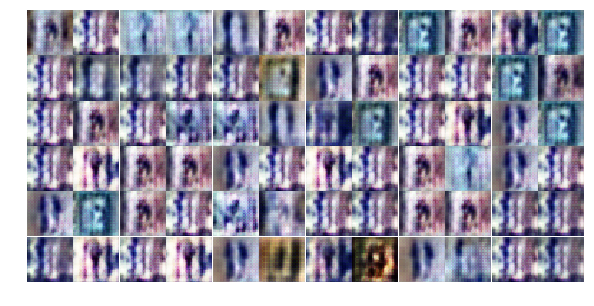

Epoch 6/10 Qfunction Loss:5.5427 Generator Loss:4.1857 Discriminator Loss:0.8773
Epoch 6/10 Qfunction Loss:4.2675 Generator Loss:3.7192 Discriminator Loss:0.8031
Epoch 6/10 Qfunction Loss:5.8225 Generator Loss:4.3960 Discriminator Loss:0.7705
Epoch 7/10 Qfunction Loss:3.3412 Generator Loss:4.8927 Discriminator Loss:0.7430
Epoch 7/10 Qfunction Loss:6.6106 Generator Loss:4.4393 Discriminator Loss:0.8281
Epoch 7/10 Qfunction Loss:4.8928 Generator Loss:4.6849 Discriminator Loss:0.7444
Epoch 7/10 Qfunction Loss:3.2917 Generator Loss:4.5439 Discriminator Loss:0.9187
Epoch 7/10 Qfunction Loss:5.0505 Generator Loss:4.1349 Discriminator Loss:0.6174
Epoch 7/10 Qfunction Loss:6.0020 Generator Loss:5.1739 Discriminator Loss:0.8279
Epoch 7/10 Qfunction Loss:2.9144 Generator Loss:5.3267 Discriminator Loss:0.4267


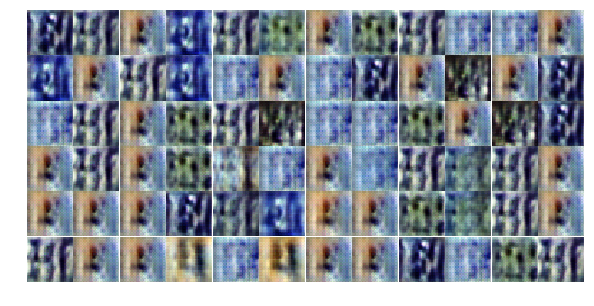

Epoch 7/10 Qfunction Loss:1.9984 Generator Loss:4.1890 Discriminator Loss:0.5566
Epoch 7/10 Qfunction Loss:10.9038 Generator Loss:5.4297 Discriminator Loss:0.4422
Epoch 7/10 Qfunction Loss:4.8873 Generator Loss:4.4817 Discriminator Loss:0.5026
Epoch 7/10 Qfunction Loss:6.7268 Generator Loss:4.4085 Discriminator Loss:0.5515
Epoch 7/10 Qfunction Loss:3.4847 Generator Loss:4.8772 Discriminator Loss:0.6561
Epoch 7/10 Qfunction Loss:4.7974 Generator Loss:4.2902 Discriminator Loss:0.7266
Epoch 7/10 Qfunction Loss:3.0149 Generator Loss:4.2537 Discriminator Loss:0.6520
Epoch 7/10 Qfunction Loss:7.5934 Generator Loss:4.6104 Discriminator Loss:0.4372
Epoch 7/10 Qfunction Loss:5.9178 Generator Loss:5.0529 Discriminator Loss:0.9650
Epoch 7/10 Qfunction Loss:7.3840 Generator Loss:3.4528 Discriminator Loss:0.9214


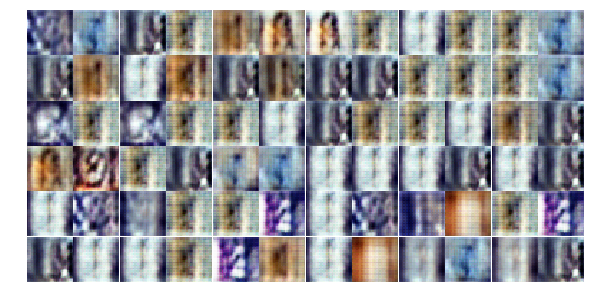

Epoch 7/10 Qfunction Loss:3.1792 Generator Loss:3.8241 Discriminator Loss:0.7115
Epoch 7/10 Qfunction Loss:3.9570 Generator Loss:4.3062 Discriminator Loss:0.6291
Epoch 7/10 Qfunction Loss:6.1513 Generator Loss:3.9394 Discriminator Loss:0.5895
Epoch 7/10 Qfunction Loss:4.5515 Generator Loss:4.5042 Discriminator Loss:0.5617
Epoch 7/10 Qfunction Loss:6.7336 Generator Loss:4.2679 Discriminator Loss:0.4851
Epoch 7/10 Qfunction Loss:3.0987 Generator Loss:4.5408 Discriminator Loss:0.4990
Epoch 7/10 Qfunction Loss:2.3750 Generator Loss:4.1880 Discriminator Loss:0.5951


In [ ]:
losses, samples = train(model=model, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
plt.plot(losses_norm.T[0], label='Qfunction', alpha=0.5)
plt.plot(losses_norm.T[1], label='Generator', alpha=0.5)
plt.plot(losses_norm.T[2], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
fig, ax = plt.subplots()
plt.plot(losses_.T[0], label='Qfunction', alpha=0.5)
plt.plot(losses_.T[1], label='Generator', alpha=0.5)
plt.plot(losses_.T[2], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

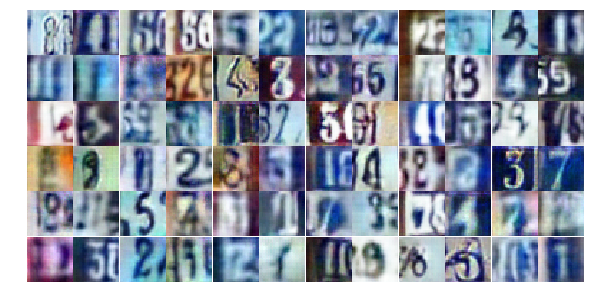

In [19]:
# Standard DCGAN
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))